In [2]:
using Distributions
using StatsPlots
using StatsBase
using LaTeXStrings
using CSV
using DataFrames
using LinearAlgebra
using Logging
using Random
using Turing
using StatisticalRethinking

# setting default attributes for plots
default(label=false)
Logging.disable_logging(Logging.Warn);

In [2]:
import Pkg; Pkg.add("BSplines");

   Resolving package versions...
   Installed BSplines ─ v0.3.3
    Updating `~/.julia/environments/v1.9/Project.toml`
  [488c2830] + BSplines v0.3.3
    Updating `~/.julia/environments/v1.9/Manifest.toml`
  [488c2830] + BSplines v0.3.3
Precompiling project...
  ✓ BSplines
  1 dependency successfully precompiled in 4 seconds. 360 already precompiled.


Install Pairplots.jl
- https://sefffal.github.io/PairPlots.jl/dev/guide/https://sefffal.github.io/PairPlots.jl/dev/guide/
- https://juliahub.com/ui/Packages/General/PairPlots

In [ ]:
Pkg.add(["CairoMakie", "PairPlots"]);

# 4.1 Why normal distributions are normal

## Code 4.1

  0.000047 seconds (2 allocations: 125.047 KiB)
size(n) = (1000, 16)
  0.001263 seconds (1.07 k allocations: 97.164 KiB)


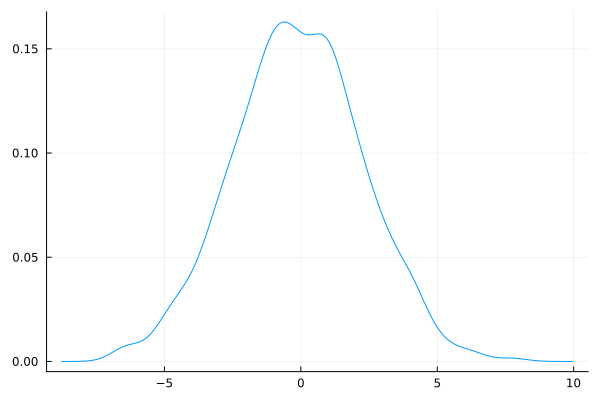

In [4]:
# equivalent to R runif(): random sample 16 times from a uniform distribution (-1,1)
@time n = rand(Uniform(-1, 1), 1000, 16);
@show size(n)
pos = sum.(eachrow(n));
@time density(pos)

## Code 4.2

In [5]:
@time prod(1 .+ rand(Uniform(0, .1), 12))

  0.000021 seconds (2 allocations: 320 bytes)


1.766690349751659

## Code 4.3

  0.129223 seconds (66.62 k allocations: 4.628 MiB, 97.97% compilation time)
  1.132106 seconds (1.89 M allocations: 114.110 MiB, 6.54% gc time, 99.56% compilation time: 28% of which was recompilation)


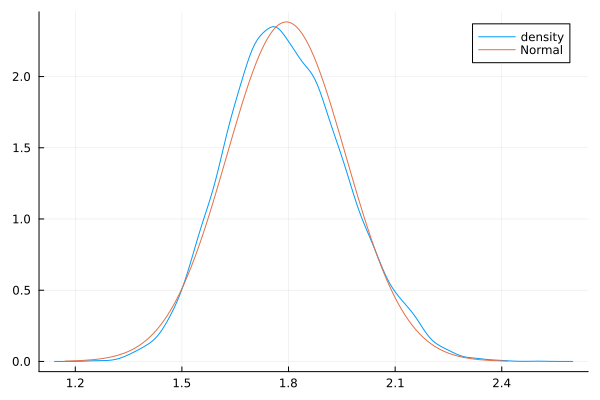

In [6]:
u = Uniform(0, .1)
growth = prod.(eachrow(1 .+ rand(u, 10000, 12)));

@time density(growth; label="density")
# overlay normal distribution
μ = mean(growth)
σ = std(growth)
@time plot!(Normal(μ, σ); label="Normal")

## Code 4.4

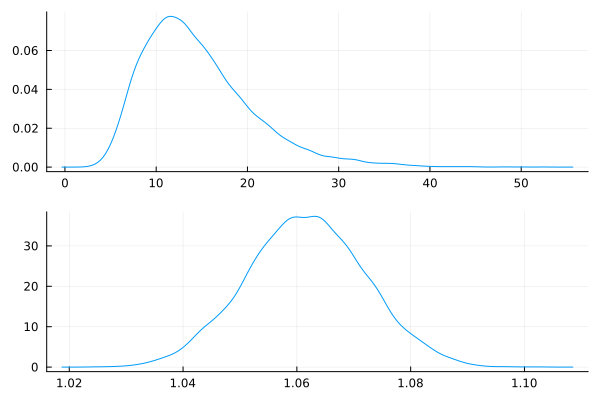

In [10]:
big = prod.(eachrow(1 .+ rand(Uniform(0, 0.5), 10000, 12)));
small = prod.(eachrow(1 .+ rand(Uniform(0, 0.01), 10000, 12)));
density([big, small]; layout=(2, 1))

## Code 4.5

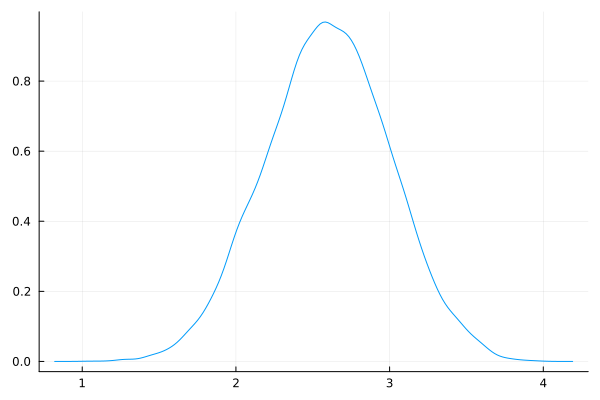

In [11]:
density(log.(big))

# 4.2 A language for describing models

## Code 4.6 Grid-search to calculate posterior

In [12]:
w = 6
n = 9
p_grid = range(0, 1; length=100)
bin_dens = [pdf(Binomial(n, p), w) for p in p_grid]
uni_dens = [pdf(Uniform(0, 1), p) for p in p_grid];
posterior = bin_dens .* uni_dens
posterior /= sum(posterior);

In [13]:
posterior

100-element Vector{Float64}:
 0.0
 8.741893987914909e-12
 5.425284098722297e-10
 5.990575360568051e-9
 3.261805587160897e-8
 1.2053991899464767e-7
 3.485649034505518e-7
 8.509009932076811e-7
 1.834811305202922e-6
 3.598403772645905e-6
 6.547828990010935e-6
 1.1213248218015673e-5
 1.826301780861177e-5
 ⋮
 0.0057411830876240195
 0.004616016455259013
 0.0035984037726459104
 0.0027005089649864604
 0.0019317387539326666
 0.0012980121298369258
 0.0008009482246260066
 0.00043696727582688777
 0.00019629917341509366
 6.189387892791484e-5
 8.227800686273486e-6
 0.0

# 4.3 Gaussian model of height

## Code 4.7 Load data/Howell1.csv

In [7]:
d = DataFrame(CSV.File("data/Howell1.csv"));

In [15]:
d

Row,height,weight,age,male
,Float64,Float64,Float64,Int64
1,151.765,47.8256,63.0,1
2,139.7,36.4858,63.0,0
3,136.525,31.8648,65.0,0
4,156.845,53.0419,41.0,1
5,145.415,41.2769,51.0,0
6,163.83,62.9926,35.0,1
7,149.225,38.2435,32.0,0
8,168.91,55.48,27.0,1
9,147.955,34.8699,19.0,0


In [8]:
size(d)

(544, 4)

## Code 4.8 Describe the dataset

In [10]:
describe(d)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,height,138.264,53.975,148.59,179.07,0,Float64
2,weight,35.6106,4.25242,40.0578,62.9926,0,Float64
3,age,29.3444,0.0,27.0,88.0,0,Float64
4,male,0.472426,0,0.0,1,0,Int64


In [11]:
parentmodule(describe)

DataAPI

## Code 4.9 summarize the dataset and draw distributions

In [13]:
precis(d)

┌────────┬────────────────────────────────────────────────────────────┐
│  param │    mean      std     5.5%      50%    94.5%      histogram │
├────────┼────────────────────────────────────────────────────────────┤
│ height │ 138.264  27.6024  81.1086   148.59  165.735  ▁▁▁▂▂▂▂▂▂██▆▁ │
│ weight │ 35.6106  14.7192   9.3607  40.0578  54.5029  ▁▃▄▄▃▂▃▆██▅▃▁ │
│    age │ 29.3444  20.7469      1.0     27.0   66.135      █▆▆▆▆▃▃▁▁ │
│   male │  0.4724   0.4997      0.0      0.0      1.0    █▁▁▁▁▁▁▁▁▁█ │
└────────┴────────────────────────────────────────────────────────────┘


## Code 4.10 Distribution of height

In [20]:
d.height

544-element Vector{Float64}:
 151.765
 139.7
 136.525
 156.845
 145.415
 163.83
 149.225
 168.91
 147.955
 165.1
 154.305
 151.13
 144.78
   ⋮
 156.21
 152.4
 162.56
 114.935
  67.945
 142.875
  76.835
 145.415
 162.56
 156.21
  71.12
 158.75

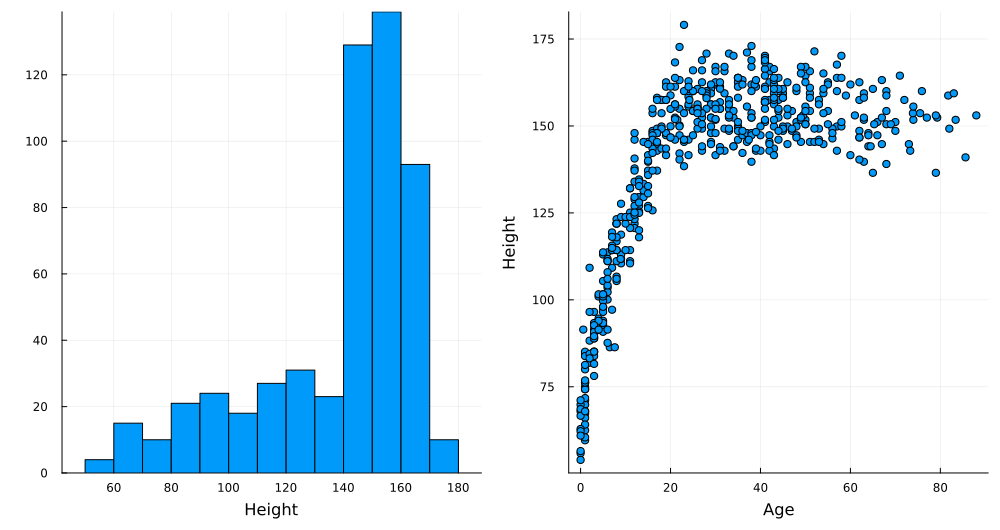

In [14]:
h_of_height = histogram(d.height, xaxis="Height")
s_age_vs_height = scatter(d.age, d.height, xaxis="Age", yaxis="Height", legend=false)

plot(h_of_height, s_age_vs_height, layout=(1,2), left_margin=5*Plots.mm, 
    bottom_margin=5*Plots.mm, size=(1000,530) ) 

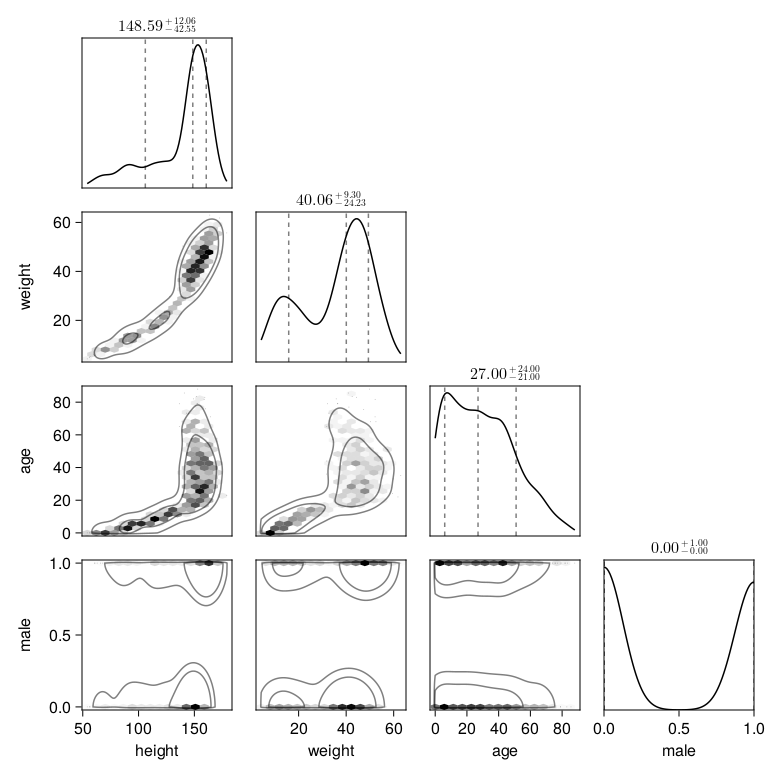

In [15]:
using CairoMakie
using PairPlots

pairplot(d)

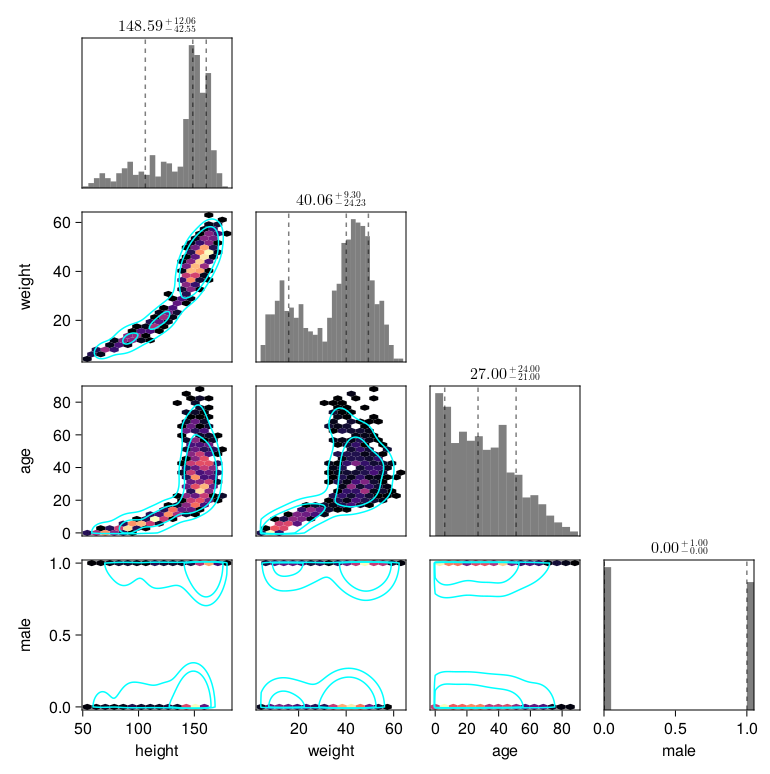

In [16]:
pairplot(
    d => (
        #PairPlots.HexBin(colormap=Makie.cgrad([:transparent, :black])),
        PairPlots.HexBin(colormap=:magma), 
        PairPlots.Scatter(filtersigma=2, color=:black),
        #PairPlots.Contour(color=:black),
        PairPlots.Contour(color=:cyan, strokewidth=5),

        # New:
        PairPlots.MarginHist(),
        PairPlots.MarginConfidenceLimits(),
    )
)

## Code 4.11  select individuals with age>=18

In [17]:
d2 = d[d.age .>= 18,:];

In [18]:
size(d2)

(352, 4)

## Code 4.12 Draw the prior for $\mu$

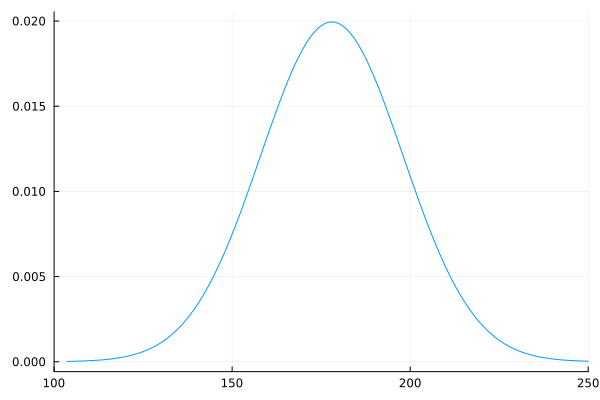

In [19]:
plot(Normal(178, 20); xlim=(100, 250))

## Code 4.13 Draw the prior of $\sigma$

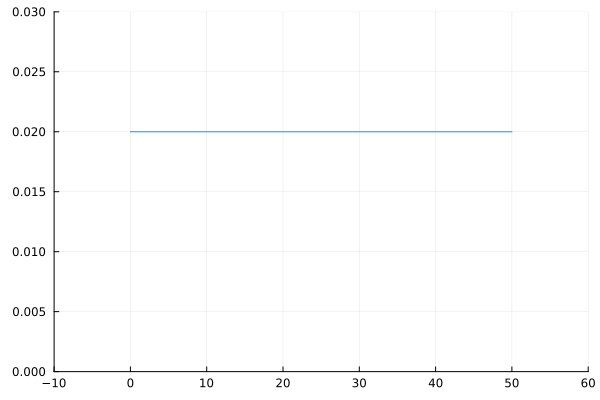

In [20]:
plot(Uniform(0, 50), xlim=(-10, 60), ylim=(0, 0.03))

## Code 4.14 Prior predictive simulation for the height model

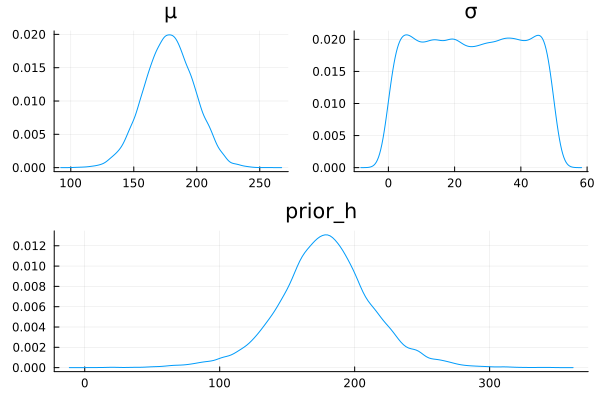

In [22]:
n = 10_000
sample_μ = rand(Normal(178, 20), n)
sample_σ = rand(Uniform(0, 50), n);
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

p1 = density(sample_μ; title="μ")
p2 = density(sample_σ; title="σ")
p3 = density(prior_h; title="prior_h")

plot(p1, p2, p3, layout=@layout [a b; c])

## Code 4.15. Restrict the predictive simulation to 0-272cm.

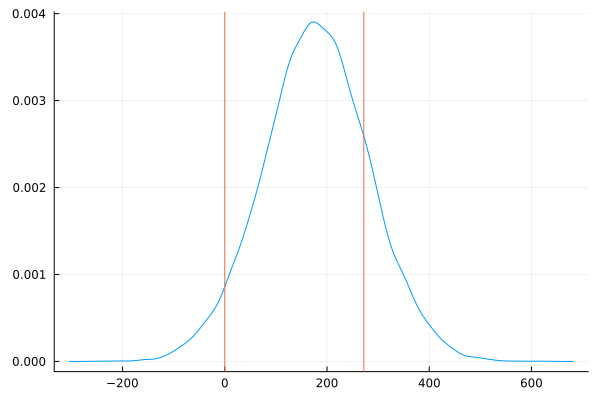

In [23]:
sample_μ = rand(Normal(178, 100), n)
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

density(prior_h)
vline!([0, 272])

## Code 4.16 Grid-search: Calculate posterior of $\mu$ and $\sigma$ using logpdf()

In [30]:
μ_list = range(150, 160; length=100)
σ_list = range(7, 9; length=100)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d2.height))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
];

max_prod = maximum(log_prod)
prob = @. exp(log_prod - max_prod);

In [31]:
@show size(log_likelihood)
@show size(log_prod)
@show size(prob)


size(log_likelihood) = (100, 100)
size(log_prod) = (100, 100)
size(prob) = (100, 100)


(100, 100)

In [32]:
prob

100×100 Matrix{Float64}:
 1.96264e-35  3.78109e-35  7.20152e-35  …  5.41219e-24  5.41688e-24
 5.35416e-34  1.01212e-33  1.89181e-33     4.04659e-23  4.01385e-23
 1.35737e-32  2.51878e-32  4.62223e-32     2.89369e-22  2.84516e-22
 3.1979e-31   5.82757e-31  1.05038e-30     1.97906e-21  1.92923e-21
 7.00144e-30  1.2535e-29   2.22006e-29     1.29454e-20  1.25139e-20
 1.42452e-28  2.50669e-28  4.3642e-28   …  8.09868e-20  7.76492e-20
 2.69342e-27  4.66035e-27  7.9793e-27      4.84574e-19  4.60906e-19
 4.73258e-26  8.05519e-26  1.3569e-25      2.77302e-18  2.6171e-18
 7.72768e-25  1.29441e-24  2.1461e-24      1.51772e-17  1.42155e-17
 1.17262e-23  1.9338e-23   3.157e-23       7.94464e-17  7.38644e-17
 1.65357e-22  2.68589e-22  4.31938e-22  …  3.97745e-16  3.67148e-16
 2.16694e-21  3.46821e-21  5.49654e-21     1.9045e-15   1.74574e-15
 2.63892e-20  4.16355e-20  6.50547e-20     8.72172e-15  7.94058e-15
 ⋮                                      ⋱               
 5.66743e-31  1.03237e-30  1.86004e

In [33]:
size(μ_list)

(100,)

In [34]:
sizeof(prob)

80000

## Code 4.17  Contour of posterior prob of $\mu$ and $\sigma$

In [35]:
# note the transposition, that's due to Julia matrix order
contour(μ_list, σ_list, prob')

LoadError: UndefVarError: `contour` not defined

## Code 4.18

In [36]:
heatmap(μ_list, σ_list, prob')

LoadError: UndefVarError: `heatmap` not defined

## Code 4.19

In [37]:
indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample_idx = wsample(vec(indices), vec(prob), 10_000; replace=true)
sample_μ = μ_list[first.(sample_idx)]
sample_σ = σ_list[last.(sample_idx)];

In [38]:
@show size(indices)
@show size(sample_idx)
@show size(sample_μ)

size(indices) = (100, 100)
size(sample_idx) = (10000,)
size(sample_μ) = (10000,)


(10000,)

In [39]:
indices

100×100 Matrix{Tuple{Int64, Int64}}:
 (1, 1)    (1, 2)    (1, 3)    (1, 4)    …  (1, 98)    (1, 99)    (1, 100)
 (2, 1)    (2, 2)    (2, 3)    (2, 4)       (2, 98)    (2, 99)    (2, 100)
 (3, 1)    (3, 2)    (3, 3)    (3, 4)       (3, 98)    (3, 99)    (3, 100)
 (4, 1)    (4, 2)    (4, 3)    (4, 4)       (4, 98)    (4, 99)    (4, 100)
 (5, 1)    (5, 2)    (5, 3)    (5, 4)       (5, 98)    (5, 99)    (5, 100)
 (6, 1)    (6, 2)    (6, 3)    (6, 4)    …  (6, 98)    (6, 99)    (6, 100)
 (7, 1)    (7, 2)    (7, 3)    (7, 4)       (7, 98)    (7, 99)    (7, 100)
 (8, 1)    (8, 2)    (8, 3)    (8, 4)       (8, 98)    (8, 99)    (8, 100)
 (9, 1)    (9, 2)    (9, 3)    (9, 4)       (9, 98)    (9, 99)    (9, 100)
 (10, 1)   (10, 2)   (10, 3)   (10, 4)      (10, 98)   (10, 99)   (10, 100)
 (11, 1)   (11, 2)   (11, 3)   (11, 4)   …  (11, 98)   (11, 99)   (11, 100)
 (12, 1)   (12, 2)   (12, 3)   (12, 4)      (12, 98)   (12, 99)   (12, 100)
 (13, 1)   (13, 2)   (13, 3)   (13, 4)      (13, 98)   (13, 

In [40]:
?wsample

search: wsample wsample!



```
wsample([rng], [a], w)
```

Select a weighted random sample of size 1 from `a` with probabilities proportional to the weights given in `w`. If `a` is not present, select a random weight from `w`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, n::Integer; replace=true, ordered=false)
```

Select a weighted random sample of size `n` from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. `replace` dictates whether sampling is performed with replacement. `ordered` dictates whether an ordered sample (also called a sequential sample, i.e. a sample where items appear in the same order as in `a`) should be taken.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, dims::Dims; replace=true, ordered=false)
```

Select a weighted random sample from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. The dimensions of the output are given by `dims`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).


## Code 4.20 Scatter plot of the posterior distribution of $\mu$ , $\sigma$

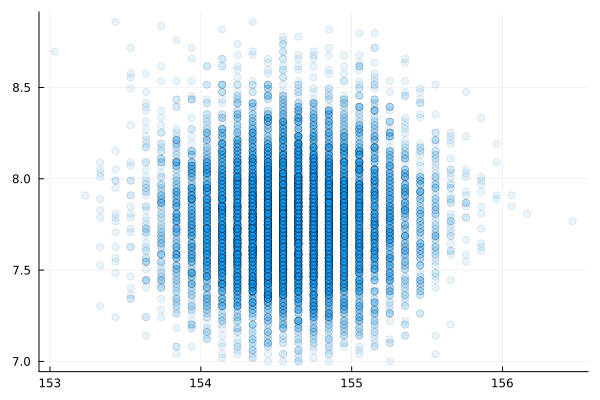

In [41]:
scatter(sample_μ, sample_σ; alpha=0.1)

## Code 4.21

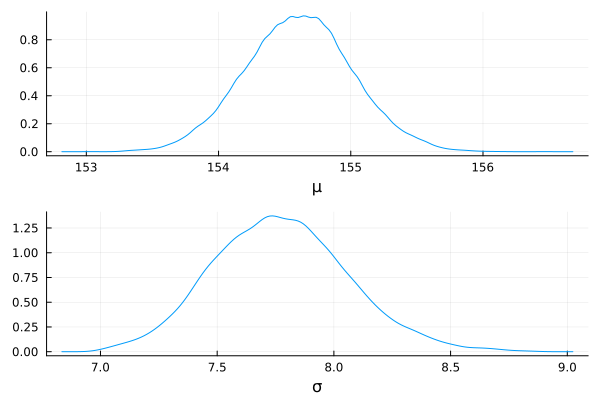

In [42]:
p1 = density(sample_μ, xaxis="μ")
p2 = density(sample_σ, xaxis="σ")
plot(p1, p2, layout=(2,1))

Pr(p|w) = (Pr(w|p)* Pr(p) )/P(w)

P(w) = \integral Pr(w, p) dp

## Code 4.22

In [43]:
println(hpdi(sample_μ, alpha=0.11))
println(hpdi(sample_σ, alpha=0.11))

[153.93939393939394, 155.15151515151516]
[7.3232323232323235, 8.232323232323232]


## Code 4.23 Generate a smaller dataset with 20 individuals sampled from the whole dataset

In [44]:
d3 = sample(d2.height, 20);

## Code 4.24 Posterior based on the smaller dataset

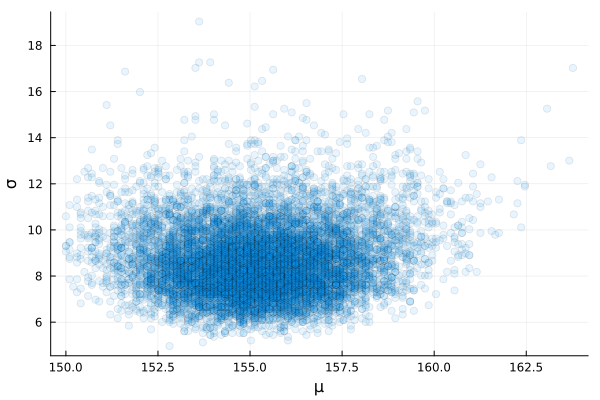

In [45]:
μ_list = range(150, 170; length=200)
σ_list = range(4, 20; length=200)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d3))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
]

max_prod = maximum(log_prod)
prob2 = @. exp(log_prod - max_prod)

indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample2_idx = wsample(vec(indices), vec(prob2), 10_000; replace=true)
sample2_μ = μ_list[first.(sample2_idx)]
sample2_σ = σ_list[last.(sample2_idx)]

scatter(sample2_μ, sample2_σ; xaxis="μ", yaxis="σ", alpha=0.1)

## Code 4.25

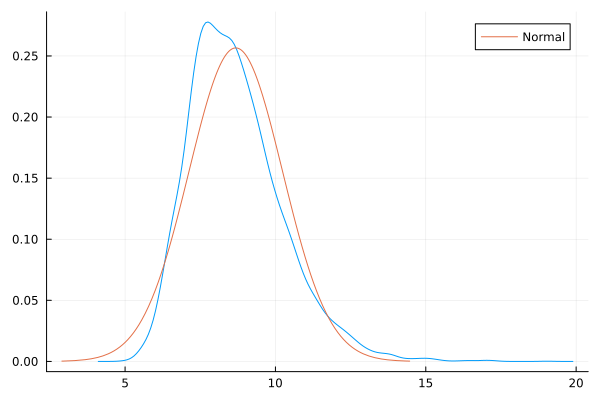

In [46]:
density(sample2_σ)
μ = mean(sample2_σ)
σ = std(sample2_σ)
plot!(Normal(μ, σ); label="Normal")

## Code 4.26 Read data/Howell1.csv

In [129]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];

## Code 4.27 The Height Bayesian Model

In [48]:
@model function model_height(height)
    μ ~ Normal(178, 20)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

model_height (generic function with 2 methods)

## Code 4.28 MCMC for the Height model

In [49]:
@time m4_1 = sample(model_height(d2.height), NUTS(), 1000)

 20.620831 seconds (31.68 M allocations: 2.015 GiB, 7.77% gc time, 99.38% compilation time)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 7.44 seconds
Compute duration  = 7.44 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           μ   154.6138    0.4074    0.0148   757.3163   626.0803    0.9992    ⋯
           σ     7.7626    0.2940    0.0097   961.1803   620.1277    1.0012    ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

 

## Code 4.29 89% credible interval of estimates

In [50]:
display.(describe(m4_1; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           μ   154.6138    0.4074    0.0148   757.3163   626.0803    0.9992    ⋯
           σ     7.7626    0.2940    0.0097   961.1803   620.1277    1.0012    ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   153.9366   155.2689
           σ     7.3155     8.2637


## Code 4.30 use the mean and std from the dataset as the initial values for the MCMC

In [51]:
init_vals = [mean(d2.height), std(d2.height)]
@time chain = sample(model_height(d2.height), NUTS(), 1000, init_theta=init_vals)

  1.797182 seconds (1.85 M allocations: 131.292 MiB, 5.87% gc time, 94.80% compilation time)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 0.65 seconds
Compute duration  = 0.65 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.6108    0.4017    0.0127   1003.4362   813.8664    1.0028   ⋯
           σ     7.7793    0.2940    0.0095    984.3070   705.8463    1.0031   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

 

## Code 4.31 MCMC with a $\mu$ prior that has small stddev

In [52]:
@model function model_height(height)
    μ ~ Normal(178, 0.1)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

m4_2 = sample(model_height(d2.height), NUTS(), 1000)
display.(describe(m4_2; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           μ   177.8595    0.1000    0.0032   960.6922   784.7858    1.0005    ⋯
           σ    24.6061    0.9170    0.0311   860.7378   677.4787    1.0022    ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   177.6944   178.0209
           σ    23.1940    26.0777


## Code 4.32 covariance of $\hat\mu$, $\hat\sigma$

In [53]:
cov(hcat(m4_1[:μ], m4_1[:σ]))

2×2 Matrix{Float64}:
 0.166006    0.00654795
 0.00654795  0.0864631

## Code 4.33  covariance and correlation of $\hat\mu$, $\hat\sigma$

In [54]:
@show c = cov(hcat(m4_1[:μ], m4_1[:σ]))
@show diag(c)
@show cov2cor(c, diag(c))

c = cov(hcat(m4_1[:μ], m4_1[:σ])) = [0.16600609516345724 0.006547948315001924; 0.006547948315001924 0.08646310651201887]
diag(c) = [0.16600609516345724, 0.08646310651201887]
cov2cor(c, diag(c)) = [1.0 0.4561948450442821; 0.4561948450442821 1.0]


2×2 Matrix{Float64}:
 1.0       0.456195
 0.456195  1.0

## Code 4.34

In [55]:
samp_chain2 = sample(m4_1, 10_000)
samp_df2 = DataFrame(samp_chain2)
@show size(samp_df2)
# check the top 5 values from this data frame
first(samp_df2, 5)

size(samp_df2) = (10000, 2)


Row,μ,σ
,Float64,Float64
1,154.208,7.92245
2,155.028,7.53548
3,154.426,7.69199
4,153.998,7.83374
5,155.191,7.74849


- 20230513 sampling from the chain directly is fixed. resetrange() is no longer needed.

- resetrange() is needed due to bug in MCMCChains: https://github.com/TuringLang/MCMCChains.jl/issues/324
- Once it will be fixed, direct sampling from the chain will be possible

In [56]:
samp_chain = sample(resetrange(m4_1), 10_000)
samp_df = DataFrame(samp_chain)
first(samp_df, 5)

Row,μ,σ
,Float64,Float64
1,154.13,7.4612
2,154.695,7.29714
3,154.662,8.23589
4,154.868,7.45551
5,154.167,7.75204


In [57]:
?resetrange

search: resetrange register_interaction! deregister_interaction!



```
resetrange(chains::Chains)
```

Generate a new chain from `chains` with iterations indexed by `1:n`, where `n` is the number of samples per chain.

The new chain and `chains` share the same data in memory.


In [58]:
parentmodule(resetrange)

MCMCChains

In [59]:
precis(samp_df2)

┌───────┬───────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%      histogram │
├───────┼───────────────────────────────────────────────────────────┤
│     μ │ 154.613  0.4073  153.935  154.605  155.269  ▁▁▂▃▇██▇▄▂▁▁▁ │
│     σ │  7.7613   0.292   7.3156   7.7526   8.2635   ▁▁▃▇█▇▄▂▁▁▁▁ │
└───────┴───────────────────────────────────────────────────────────┘


## Code 4.35 summarizing the estimates

In [60]:
precis(samp_df)

┌───────┬───────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%      histogram │
├───────┼───────────────────────────────────────────────────────────┤
│     μ │ 154.613  0.4088  153.935  154.606  155.268  ▁▁▂▃▆█▇▇▄▂▁▁▁ │
│     σ │  7.7634  0.2949   7.3247   7.7535   8.2735   ▁▁▃▇█▇▄▂▁▁▁▁ │
└───────┴───────────────────────────────────────────────────────────┘


In [61]:
parentmodule(precis)

StatisticalRethinking

## Code 4.36 sample from multi-variate normal

In [62]:
data = hcat(m4_1[:μ], m4_1[:σ])
@show size(data)
@show μ = mean(data, dims=1)
@show σ = cov(data)
@show mvn = MvNormal(vec(μ), σ)
post = rand(mvn, 10_000);
print(mvn)

size(data) = (1000, 2)
μ = mean(data, dims = 1) = [154.6137633793002 7.762555916020377]
σ = cov(data) = [0.16600609516345724 0.006547948315001924; 0.006547948315001924 0.08646310651201887]
mvn = MvNormal(vec(μ), σ) = FullNormal(
dim: 2
μ: [154.6137633793002, 7.762555916020377]
Σ: [0.16600609516345724 0.006547948315001924; 0.006547948315001924 0.08646310651201887]
)

FullNormal(
dim: 2
μ: [154.6137633793002, 7.762555916020377]
Σ: [0.16600609516345724 0.006547948315001924; 0.006547948315001924 0.08646310651201887]
)


# 4.4 Linear predictions

## Code 4.37 fancy way of doing scatter(d2.weight, d2.height)

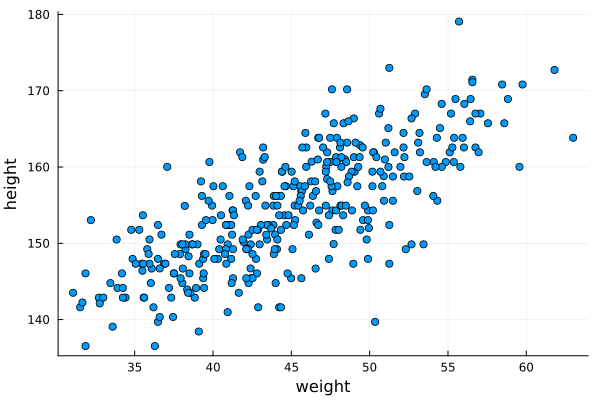

In [63]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];
# fancy way of doing scatter(d2.weight, d2.height)
@df d2 scatter(:weight, :height, xaxis="weight", yaxis="height")

## Code 4.38 Prior predictive simulation

In [64]:
Random.seed!(2971)
N = 100
α_vec = rand(Normal(178, 20), N)
β_vec = rand(Normal(0, 10), N);

## Code 4.39 Draw different prior predictive simulations

In [65]:
extrema(d2.weight)

(31.071052, 62.992589)

In [66]:
parentmodule(extrema)

Base

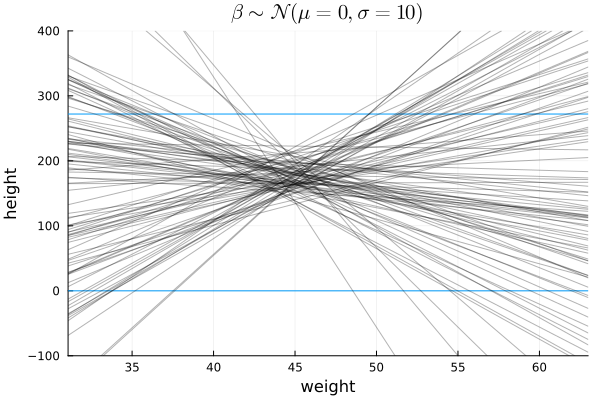

In [67]:
p = hline([0, 272]; ylims=(-100, 400), xlabel="weight", ylabel="height")
title!(L"\beta \sim \mathcal{N}(\mu=0,\sigma=10)")

x_mean = mean(d2.weight)
xlims = extrema(d2.weight)  # getting min and max in one pass

for (α, β) ∈ zip(α_vec, β_vec)
    plot!(x -> α + β * (x - x_mean); xlims=xlims, c=:black, alpha=0.3)
end
display(p)

## Code 4.40 log-normal for $\beta$.

- log($\beta$) ~ Normal(0,1).
- $\beta$ ~ $exp^{Normal(0,1)}$

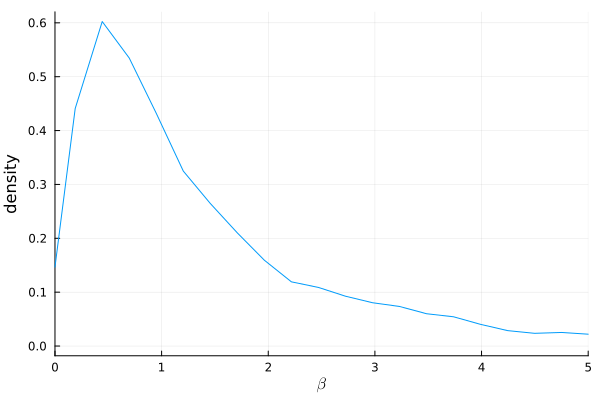

In [68]:
β_vec = rand(LogNormal(0, 1), 10_000)
density(β_vec, xlims=(0, 5), bandwidth=0.02, xaxis=L"\beta", yaxis="density")

## Code 4.41 Prior of $\beta$ in LogNormal

In [69]:
Random.seed!(2971)
N = 100
α_vec = rand(Normal(178, 20), N)
β_vec = rand(LogNormal(0, 1), N);

## Code 4.42 MCMC Sampling (Model fitting)

In [70]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:]
xbar = mean(d2.weight)

@model function height_regr_model(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    μ = @. α + β * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time m4_3 = sample(height_regr_model(d2.weight, d2.height), NUTS(), 1000)
@time m4_3 = resetrange(m4_3);
m4_3

  8.913012 seconds (11.64 M allocations: 934.322 MiB, 9.19% gc time, 96.63% compilation time)
  0.000007 seconds (1 allocation: 96 bytes)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 1:1000
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 6.41 seconds
Compute duration  = 6.41 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           α   154.5925    0.2685    0.0084   1042.7116   650.8592    1.0029   ⋯
           β     0.9027    0.0442    0.0011   1581.2344   769.2823    1.0000   ⋯
           σ     5.1032    0.1883    0.0049   1473.7644   767.7530    1.0005   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%    

## Code 4.43 Put exponential into $\beta$

In [71]:
xbar = mean(d2.weight)

@model function height_regr_model_exp(weight, height)
    α ~ Normal(178, 20)
    log_β ~ Normal(0, 1)
    μ = @. α + exp(log_β) * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time m4_3b = sample(height_regr_model_exp(d2.weight, d2.height), NUTS(), 1000);
m4_3b

  6.042622 seconds (6.17 M allocations: 579.164 MiB, 7.49% gc time, 96.64% compilation time)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 4.59 seconds
Compute duration  = 4.59 seconds
parameters        = α, log_β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           α   154.5892    0.2773    0.0075   1368.7168   513.4724    1.0050   ⋯
       log_β    -0.1019    0.0463    0.0013   1301.3491   843.2654    1.0002   ⋯
           σ     5.1197    0.1938    0.0048   1663.6517   805.1519    0.9998   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      7

In [72]:
exp(-0.0994)

0.9053804833900955

## Code 4.44 summarize the model estimates, mean, std, 89% CI, histogram

In [73]:
m4_3_df = DataFrame(m4_3)
precis(m4_3_df)

┌───────┬──────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%     histogram │
├───────┼──────────────────────────────────────────────────────────┤
│     α │ 154.593  0.2685  154.169  154.603  155.005    ▁▁▂▅██▅▂▁▁ │
│     β │  0.9027  0.0442    0.833   0.9013   0.9732       ▁▂██▃▁▁ │
│     σ │  5.1032  0.1883   4.8118   5.0941   5.4244  ▁▂▄▇██▆▄▂▁▁▁ │
└───────┴──────────────────────────────────────────────────────────┘


## Code 4.45 Covariance among parameters

In [74]:
round.(cov(Matrix(m4_3_df)), digits=3)

3×3 Matrix{Float64}:
  0.072  -0.0    -0.002
 -0.0     0.002   0.0
 -0.002   0.0     0.035

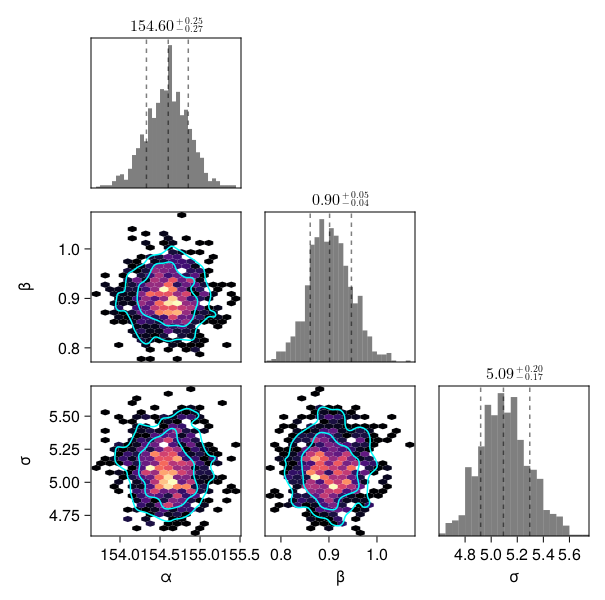

In [75]:
pairplot(
    m4_3_df => (
        #PairPlots.HexBin(colormap=Makie.cgrad([:transparent, :black])),
        PairPlots.HexBin(colormap=:magma), 
        PairPlots.Scatter(filtersigma=2, color=:black),
        #PairPlots.Contour(color=:black),
        PairPlots.Contour(color=:cyan, strokewidth=5),

        # New:
        PairPlots.MarginHist(),
        PairPlots.MarginConfidenceLimits(),
    )
)

## Code 4.46 Posterior inteference of height

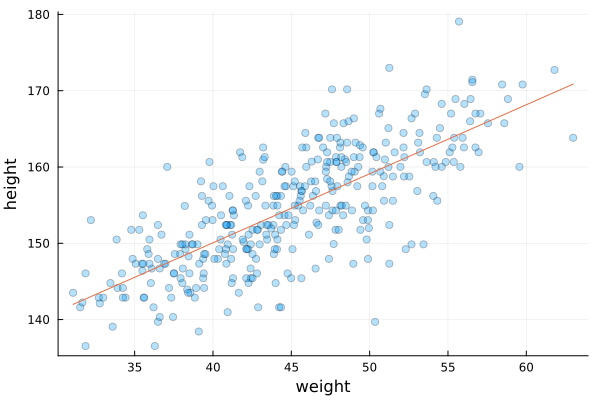

In [76]:
p = @df d2 scatter(:weight, :height; alpha=0.3, xaxis="weight", yaxis="height")

chain = resetrange(m4_3)
samples = sample(chain, 1000)

α_map = mean(samples[:α])
β_map = mean(samples[:β])
plot!(x -> α_map + β_map*(x-xbar))

## Code 4.47 DataFrame of posterior values of parameters

In [77]:
post = sample(m4_3, 1000)
post_df = DataFrame(post)
post_df[1:5,:]

Row,α,β,σ
,Float64,Float64,Float64
1,154.32,0.916849,5.08646
2,154.414,0.884345,4.80344
3,154.888,0.843046,5.12873
4,154.396,0.941856,5.28053
5,154.67,0.901098,5.34386


## Code 4.48 MCMC-Sample again with 10 samples

In [78]:
N = 10
dN = d2[1:N,:]

@model function height_regr_model_N(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    m_weight = mean(weight)
    μ = @. α + β * (weight - m_weight)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time mN = sample(height_regr_model(dN.weight, dN.height), NUTS(), 1000)
mN = resetrange(mN);
mN

  0.227587 seconds (873.07 k allocations: 95.188 MiB, 51.25% gc time)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 1:1000
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 0.19 seconds
Compute duration  = 0.19 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           α   152.1620    1.9255    0.0661   854.2814   620.8839    1.0013    ⋯
           β     0.9188    0.1852    0.0066   824.1905   438.4362    1.0003    ⋯
           σ     5.7619    1.7883    0.0915   420.5284   457.8613    0.9992    ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%    

## Code 4.49 Visualize the Model uncertainty with only 10 samples

In [79]:
post = sample(mN, 20)
size(post)
post
post_df = DataFrame(post);
post_df

Row,α,β,σ
,Float64,Float64,Float64
1,152.944,0.952473,6.01067
2,154.312,0.709287,5.15806
3,151.569,0.853462,6.81366
4,154.689,1.13649,8.90502
5,150.153,1.10581,6.90951
6,150.064,0.938775,5.43649
7,152.184,0.574623,11.8293
8,153.41,0.599674,5.79337
9,154.278,1.34203,8.26883


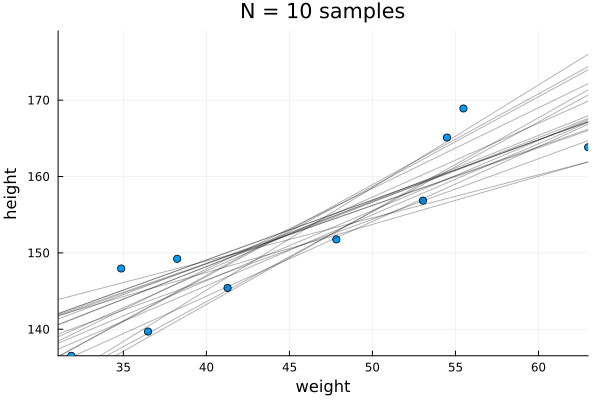

In [80]:
post = sample(mN, 20)
post_df = DataFrame(post);

xlims = extrema(d2.weight)
ylims = extrema(d2.height)
p = @df dN scatter(:weight, :height; xlims=xlims, ylims=ylims)
title!("N = $N samples"; xlab="weight", ylab="height")

x_mean = mean(dN.weight)
for (α, β) ∈ zip(post_df.α, post_df.β)
    plot!(x -> α + β * (x-x_mean); c="black", alpha=0.3)
end
display(p)

## Code 4.50 The mean height corresponding to weight=50kg

In [81]:
post = sample(m4_3, 1000)
post_df = DataFrame(post)
@time μ_at_50 = @. post_df.α + post_df.β * (50 - xbar);
μ_at_50

  0.203883 seconds (158.83 k allocations: 10.577 MiB, 18.88% gc time, 97.60% compilation time)


1000-element Vector{Float64}:
 159.2461456296854
 159.5863255290389
 159.04212520600416
 158.89687031459374
 159.26079763909476
 159.03506897422454
 159.30693793386962
 159.28410792720246
 159.27837348742386
 159.5840828588247
 158.9560363521461
 158.73458680653872
 159.13624880034354
   ⋮
 159.27612132563212
 159.68300670623196
 158.61024977357556
 159.30040337527763
 159.63811668985704
 159.2064119068462
 158.75819434935337
 159.07478451175467
 159.10510977769746
 159.21050051789297
 159.08102055742071
 159.65631323578458

## Code 4.51 Histogram of the height for weight=50kg

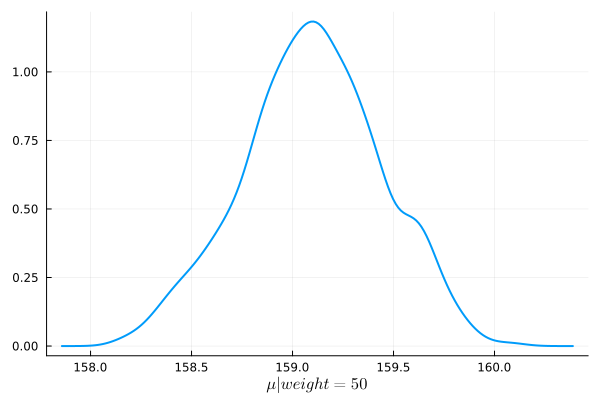

In [82]:
density(μ_at_50; lw=2, xlab=L"\mu|weight=50")

## Code 4.52  89% CI of height for weight=50kg

In [83]:
PI(μ_at_50)

2-element Vector{Float64}:
 158.5132332088787
 159.65633983206826

In [84]:
parentmodule(PI)

StatisticalRethinking

## Code 4.53

In [130]:
μ = link(post_df, [:α :β], d2.weight, xbar);
μ = hcat(μ...);
Base.size(μ), μ[1:5,1]

((1000, 352), [157.2545243191, 157.71917622187746, 157.07465621965798, 157.14648419454934, 157.1660032946683])

## Code 4.54

In [117]:
weight_seq = 25:70
μ = link(post_df, [:α :β], weight_seq, xbar);
μ = hcat(μ...);
Base.size(μ), μ[1:5,1]

((1000, 46), [136.34756137405955, 138.11885302278105, 136.42123130678362, 138.7718777586879, 135.17598566248517])

## Code 4.55

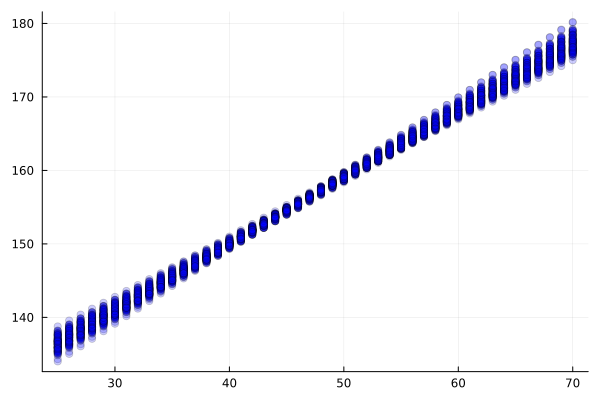

In [118]:
p = plot()
for i in 1:100
    Plots.scatter!(weight_seq, μ[i,:]; c=:blue, alpha=0.2)
end
display(p)

## Code 4.56

In [131]:
μ_mean = mean.(eachcol(μ))
μ_PI = PI.(eachcol(μ))
μ_PI = vcat(μ_PI'...);
μ_PI

352×2 Matrix{Float64}:
 156.636  157.608
 146.223  147.669
 141.782  143.761
 161.149  162.593
 150.728  151.743
 169.493  172.207
 147.896  149.148
 163.217  164.928
 144.677  146.288
 162.382  163.974
 158.424  159.555
 150.675  151.694
 145.793  147.29
   ⋮      
 147.729  149.008
 153.376  154.21
 153.294  154.133
 156.684  157.657
 148.995  150.129
 150.516  151.547
 150.303  151.351
 155.969  156.862
 144.083  145.755
 160.401  161.741
 162.022  163.566
 160.716  162.097

## Code 4.57

In [132]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
Plots.plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)

LoadError: Expects 46 elements in each col of y, found 352.

## Code 4.58

In [90]:
post = sample(m4_3, 1000)
post = DataFrame(post)

weight_seq = 25:70
μ = map(w -> post.a + post.b * (w - xbar), weight_seq)
μ = hcat(μ...)
μ_mean = mean.(eachcol(μ))
μ_CI = PI.(eachcol(μ));

LoadError: ArgumentError: column name "a" not found in the data frame; existing most similar names are: "α", "β" and "σ"

## Code 4.59

In [91]:
sim_height = simulate(post, [:a, :b, :σ], weight_seq .- xbar);
Base.size(sim_height), sim_height[1:5,1]

LoadError: ArgumentError: column name "a" not found in the data frame; existing most similar names are: "α", "β" and "σ"

## Code 4.60

In [92]:
height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

LoadError: UndefVarError: `sim_height` not defined

## Code 4.61

In [93]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

LoadError: Expects 46 elements in each col of y, found 2.

## Code 4.62

In [94]:
post = sample(m4_3, 10_000)
post = DataFrame(post)
sim_height = simulate(post, [:a, :b, :σ], weight_seq .- xbar)
height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

LoadError: ArgumentError: column name "a" not found in the data frame; existing most similar names are: "α", "β" and "σ"

In [95]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

LoadError: Expects 46 elements in each col of y, found 2.

## Code 4.63

In [96]:
post = sample(m4_3, 1000)
post = DataFrame(post)

sim_height = [
    [
        rand(Normal(a + b * (w - xbar), σ))
        for (a, b, σ) ∈ zip(post.a, post.b, post.σ)
    ]
    for w ∈ weight_seq
]
sim_height = hcat(sim_height...)

height_PI = PI.(eachcol(sim_height));
height_PI = vcat(height_PI'...);

LoadError: ArgumentError: column name "a" not found in the data frame; existing most similar names are: "α", "β" and "σ"

In [97]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

LoadError: Expects 46 elements in each col of y, found 2.

# 4.5 Curves from lines

## Code 4.64

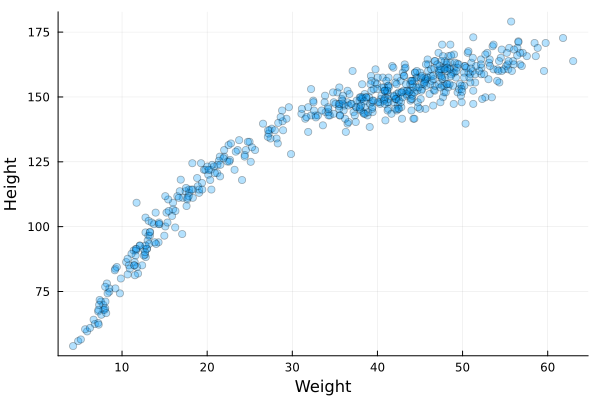

In [119]:
d = DataFrame(CSV.File("data/Howell1.csv"))
scatter(d.weight, d.height; alpha=0.3, xaxis="Weight", yaxis="Height")

## Code 4.65

In [99]:
d[!, :weight_s] = standardize(ZScoreTransform, d.weight)
d[!, :weight_s2] = d.weight_s.^2;

@model function height_regr_m2(weight_s, weight_s2, height)
    a ~ Normal(178, 20)
    b1 ~ LogNormal(0, 1)
    b2 ~ Normal(0, 1)
    μ = @. a + b1 * weight_s + b2 * weight_s2
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_5 = sample(height_regr_m2(d.weight_s, d.weight_s2, d.height), NUTS(), 1000)
m4_5 = resetrange(m4_5)
m4_5_df = DataFrame(m4_5);

## Code 4.66

In [100]:
precis(m4_5_df)

┌───────┬───────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%      histogram │
├───────┼───────────────────────────────────────────────────────────┤
│     a │ 146.043  0.3826  145.429  146.052  146.677  ▁▁▂▃▆▇█▇▄▂▁▁▁ │
│    b1 │ 21.7601  0.2995  21.2921  21.7639  22.2506     ▁▁▄▆██▅▃▁▁ │
│    b2 │ -7.7861  0.2857  -8.2375  -7.7849  -7.3354      ▁▁▂▅██▆▃▁ │
│     σ │  5.8112  0.1807   5.5248   5.8128   6.1065  ▁▁▂▄▅██▆▃▂▁▁▁ │
└───────┴───────────────────────────────────────────────────────────┘


## Code 4.67

In [101]:
Random.seed!(1)
df = sample(m4_5_df, 1000)
weight_seq = range(-2.2, 2; length=30)

mu = link(df, (r, x) -> r.a + r.b1*x + r.b2*x^2, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

sim_height = simulate(df, (r, x) -> Normal(r.a + r.b1*x + r.b2*x^2, r.σ), weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

## Code 4.68

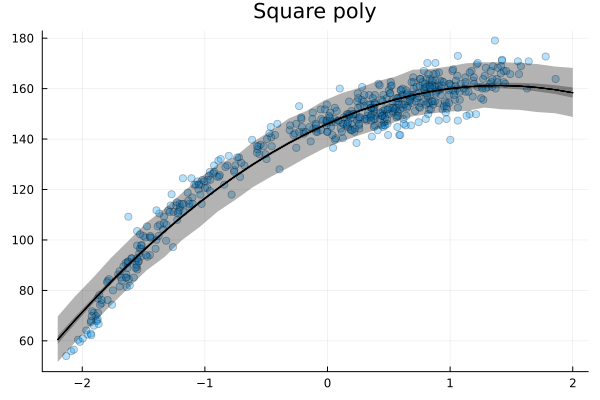

In [102]:
p_square = @df d scatter(:weight_s, :height; alpha=0.3, title="Square poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.69

In [103]:
d[!, :weight_s3] = d.weight_s.^3;

@model function height_regr_m3(weight_s, weight_s2, weight_s3, height)
    a ~ Normal(178, 20)
    b1 ~ LogNormal(0, 1)
    b2 ~ Normal(0, 1)
    b3 ~ Normal(0, 1)
    μ = @. a + b1 * weight_s + b2 * weight_s2 + b3 * weight_s3
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_6 = sample(height_regr_m3(d.weight_s, d.weight_s2, d.weight_s3, d.height), NUTS(), 1000)
m4_6 = resetrange(m4_6)
m4_6_df = DataFrame(m4_6)
precis(m4_6_df)

┌───────┬─────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%    histogram │
├───────┼─────────────────────────────────────────────────────────┤
│     a │ 146.402  0.3036  145.884  146.416  146.867   ▁▁▃▅██▆▃▁▁ │
│    b1 │ 15.1857  0.4898  14.3741  15.1921  15.9453      ▁▂▅█▅▁▁ │
│    b2 │ -6.2037  0.2639  -6.6274  -6.2174  -5.7711    ▁▂▅██▅▂▁▁ │
│    b3 │  3.5957  0.2352   3.2359   3.5897   3.9835   ▁▁▂▅██▄▂▁▁ │
│     σ │  4.8649  0.1503   4.6304    4.856   5.1178  ▁▁▄▇██▄▂▁▁▁ │
└───────┴─────────────────────────────────────────────────────────┘


In [104]:
Random.seed!(1)
df = sample(m4_6_df, 1000)
weight_seq = range(-2.2, 2; length=30)

func = (r, x) -> r.a + r.b1*x + r.b2*x^2 + r.b3*x^3
mu = link(df, func, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

func = (r, x) -> Normal(r.a + r.b1*x + r.b2*x^2 + r.b3*x^3, r.σ)
sim_height = simulate(df, func, weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

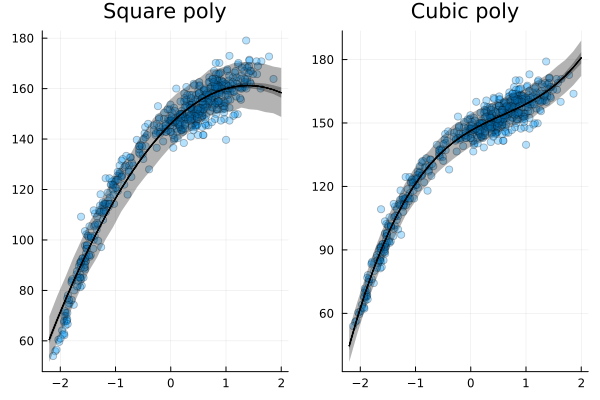

In [105]:
p_cubic = @df d scatter(:weight_s, :height; alpha=0.3, title="Cubic poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

plot(p_square, p_cubic; layout=(1, 2))

## Code 4.70 and 4.71

Looks like Julia plots don't support change of ticks proposed in the book.
But much more natural way will be to remap values we're plotting back to the original scale.
Example of this is below.

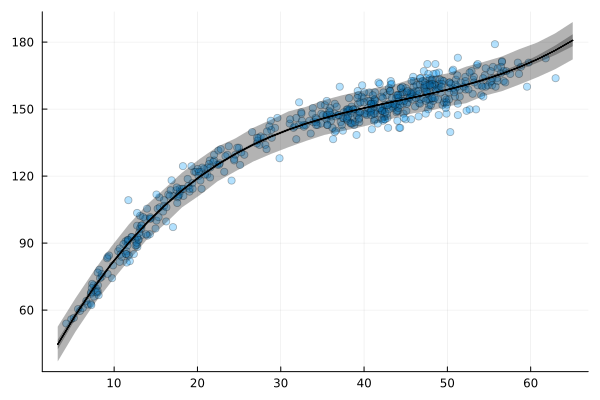

In [106]:
μ = mean(d.weight)
σ = std(d.weight)
w = @. d.weight_s * σ + μ
scatter(w, d.height; alpha=0.3)

w_s = @. weight_seq * σ + μ
plot!(w_s, mu_mean; c=:black)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.72

In [107]:
d = DataFrame(CSV.File("data/cherry_blossoms.csv", missingstring="NA"))
precis(d)

┌────────────┬─────────────────────────────────────────────────────────┐
│      param │   mean      std    5.5%     50%    94.5%      histogram │
├────────────┼─────────────────────────────────────────────────────────┤
│       year │ 1408.0  350.885  867.77  1408.0  1948.23  ████████████▂ │
│        doy │ 104.54    6.407   94.43   105.0    115.0       ▁▂▆██▅▂▁ │
│       temp │ 6.1419   0.6636    5.15     6.1   7.2947       ▁▄▆█▄▂▁▁ │
│ temp_upper │ 7.1852   0.9929  5.8977    7.04   8.9023       ▂██▃▁▁▁▁ │
│ temp_lower │ 5.0989   0.8503  3.7876   5.145     6.37       ▁▁▁▂▇█▂▁ │
└────────────┴─────────────────────────────────────────────────────────┘


## Code 4.73

In [108]:
d2 = d[completecases(d[!,[:doy]]),:]
d2 = disallowmissing(d2[!,[:year,:doy]])
num_knots = 15
knots_list = quantile(d2.year, range(0, 1; length=num_knots));

## Code 4.74

In [120]:
using BSplines

basis = BSplineBasis(3, knots_list)

16-element BSplineBasis{Vector{Float64}}:
 order: 3
 breakpoints: [812.0, 1036.0, 1174.0, 1269.0, 1377.0, 1454.0, 1518.0, 1583.0, 1650.0, 1714.0, 1774.0, 1833.0, 1893.0, 1956.0, 2015.0]

## Code 4.75

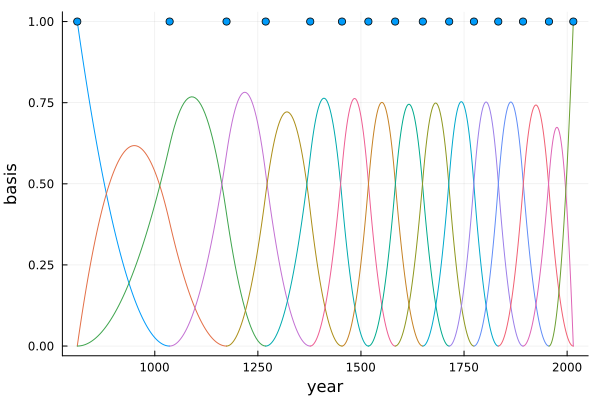

In [122]:
p1 = plot(basis)
Plots.scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis", legend=false)

## Code 4.76

This way of calucalting bsplines is slightly slower, than shown in the book (with pre-calculated matrix) but it is much cleaner in my perspective.

You can do comparison yourself by precalculating spline matrix outside of the model and do matrix multiplication in the model instead of spline evialutaion. Example of doing this is at code block 4.79

In [123]:
@model function model_splines(year, doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    s = Spline(basis, w)
    μ = a .+ s.(year)
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

@time m4_7 = sample(model_splines(d2.year, d2.doy), NUTS(0.65; init_ϵ = 9.765625e-5), 1000)
m4_7

 20.224091 seconds (46.45 M allocations: 16.507 GiB, 19.16% gc time, 40.71% compilation time: 10% of which was recompilation)


Chains MCMC chain (1000×30×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 18.87 seconds
Compute duration  = 18.87 seconds
parameters        = w[1], w[2], w[3], w[4], w[5], w[6], w[7], w[8], w[9], w[10], w[11], w[12], w[13], w[14], w[15], w[16], a, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

        w[1]    -0.6763    0.8970    0.0193   2146.8786   538.5601    1.0006   ⋯
        w[2]    -0.8608    0.8424    0.0188   2017.1835   764.9005    1.0005   ⋯
        w[3]     0.7955    0.7725    0.0197   1552.6661   766.1835    0.9991   ⋯
        w[4]     0.6929    0.7679    0.0189   

## Code 4.77

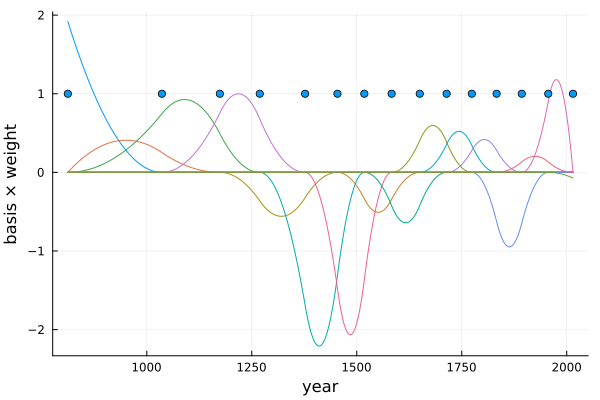

In [125]:
post = DataFrame(m4_7)

# convert columns w[*] into single column w
w_df = DataFrames.select(post, r"w")
post = DataFrames.select(post, Not(r"w"))
post[!,:w] = Vector.(eachrow(w_df))

# vector of 16 average w values
w_mean = mean.(eachcol(w_df))
p2 = plot(basis .* w_mean)
Plots.scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis × weight")

## Code 4.78

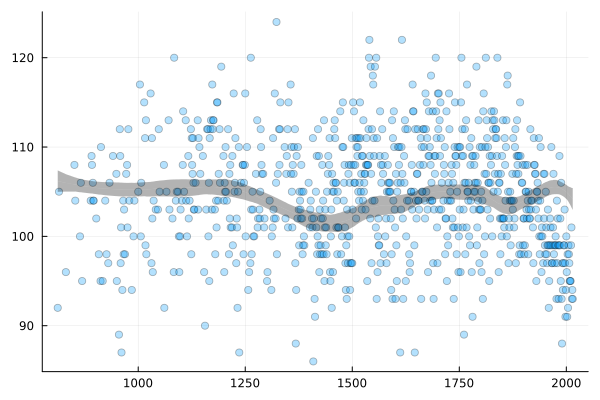

In [126]:
μ = link(post, (r, x) -> r.a + Spline(basis, r.w)(x), d2.year)
μ = vcat(μ'...);

μ_PI = PI.(eachrow(μ))
μ_PI = vcat(μ_PI'...);

p3 = @df d2 scatter(:year, :doy; alpha=0.3)
μ_mean = mean.(eachrow(μ_PI))
Plots.plot!(d2.year, [μ_mean, μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3, alpha=0)

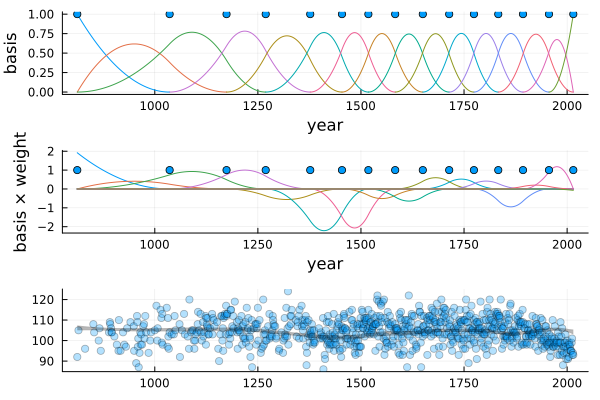

In [127]:
plot(p1, p2, p3; layout=(3, 1))

## Code 4.79

How to build the model with explicit spline matrix calculation

In [128]:
basis = BSplineBasis(3, knots_list)

# list of splines with 1 only at corresponding basis index
splines = [
    Spline(basis, [float(idx == knot) for idx ∈ 1:length(basis)])
    for knot ∈ 1:length(basis)
]

# calculate each spline for every year. Resulting matrix B is 827x16
B = [
    map(s -> s(year), splines)
    for year in d2.year
]
B = vcat(B'...);


# do not need years parameter anymore, all the information is in B matrix
@model function model_splines_matrix(doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    μ = a .+ B * w
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

@time m4_7alt = sample(model_splines_matrix(d2.doy), NUTS(0.65; init_ϵ = 0.0001953125), 1000)
m4_7alt

  8.100614 seconds (5.76 M allocations: 8.609 GiB, 19.25% gc time, 50.41% compilation time)


Chains MCMC chain (1000×30×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 6.68 seconds
Compute duration  = 6.68 seconds
parameters        = w[1], w[2], w[3], w[4], w[5], w[6], w[7], w[8], w[9], w[10], w[11], w[12], w[13], w[14], w[15], w[16], a, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

        w[1]    -0.6599    0.9195    0.0211   1859.5073   792.1886    1.0018   ⋯
        w[2]    -0.8571    0.8522    0.0176   2353.6945   849.9177    1.0029   ⋯
        w[3]     0.8368    0.8092    0.0157   2604.6750   874.7171    0.9991   ⋯
        w[4]     0.6692    0.7791    0.0186   17